<a href="https://colab.research.google.com/github/DroitXenon/Intact.CxC.Group.Project/blob/main/CxC_Group_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Load Data


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import numpy as np
import pandas as pd
df = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/new_train.csv", index_col=0)
test_df = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/new_test.csv", index_col=0)

print("Train size", len(df))
print("Test size", len(test_df))

df.head(n=3)

df


Train size 3969
Test size 997


,medical_specialty,transcription,labels
0,Emergency Room Reports,"REASON FOR THE VISIT:, Very high PT/INR.,HIST...",0
1,Surgery,"PREOPERATIVE DIAGNOSIS:, Acetabular fracture ...",1
2,Surgery,"NAME OF PROCEDURE,1. Selective coronary angio...",1
3,Radiology,"REFERRING DIAGNOSIS: , Motor neuron disease.,P...",2
4,Emergency Room Reports,"CHIEF COMPLAINT: , Dental pain.,HISTORY OF PRE...",0
...,...,...,...
3995,Neurology,"PROBLEMS AND ISSUES:,1. Headaches, nausea, an...",4
3996,Surgery,"PREOPERATIVE DIAGNOSIS: , Anemia.,PROCEDURE:, ...",1
3997,Surgery,"1. Odynophagia.,2. Dysphagia.,3. Gastroesop...",1
3998,Gastroenterology,The patient's abdomen was prepped and draped i...,5


In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.ensemble import RandomForestRegressor
vect = CountVectorizer()

vect.fit([df.transcription[0]])

CountVectorizer()

In [ ]:
print("Vocabulary size: {}".format(vect.vocabulary_))

Vocabulary size: {'reason': 138, 'for': 70, 'the': 174, 'visit': 187, 'very': 185, 'high': 84, 'pt': 136, 'inr': 92, 'history': 85, 'patient': 127, 'is': 95, 'an': 13, '81': 7, 'year': 200, 'old': 123, 'lady': 99, 'whom': 196, 'met': 107, 'last': 100, 'month': 110, 'when': 194, 'she': 159, 'came': 34, 'in': 89, 'with': 198, 'pneumonia': 131, 'and': 14, 'chf': 40, 'was': 191, 'noticed': 120, 'to': 178, 'be': 24, 'atrial': 21, 'fibrillation': 69, 'which': 195, 'chronic': 41, 'problem': 134, 'her': 82, 'did': 55, 'not': 119, 'want': 190, 'have': 78, 'coumadin': 51, 'started': 166, 'because': 25, 'said': 155, 'that': 173, 'has': 77, 'had': 76, 'it': 96, 'before': 27, 'been': 26, 'difficult': 56, 'regulate': 140, 'point': 132, 'dangerous': 53, 'but': 32, 'convinced': 48, 'restart': 146, 'again': 11, 'gave': 72, 'as': 17, 'outpatient': 125, 'then': 175, 'found': 71, '12': 3, 'so': 163, 'told': 179, 'come': 45, 'emergency': 64, 'room': 150, 'get': 74, 'vitamin': 189, 'reverse': 147, 'anticoag

RUN BELOW BLOCK FOR TRAINING

In [ ]:
# Merge all the transcription together
trans = df.drop(['labels', 'medical_specialty'], axis = 1)
result = (' '.join(trans['transcription'])).lower()
result

'reason for the visit:,  very high pt/inr.,history: , the patient is an 81-year-old lady whom i met last month when she came in with pneumonia and chf.  she was noticed to be in atrial fibrillation, which is a chronic problem for her.  she did not want to have coumadin started because she said that she has had it before and the inr has had been very difficult to regulate to the point that it was dangerous, but i convinced her to restart the coumadin again.  i gave her the coumadin as an outpatient and then the inr was found to be 12.  so, i told her to come to the emergency room to get vitamin k to reverse the anticoagulation.,past medical history:,1.  congestive heart failure.,2.  renal insufficiency.,3.  coronary artery disease.,4.  atrial fibrillation.,5.  copd.,6.  recent pneumonia.,7.  bladder cancer.,8.  history of ruptured colon.,9.  myocardial infarction.,10.  hernia repair.,11.  colon resection.,12.  carpal tunnel repair.,13.  knee surgery.,medications:,1.  coumadin.,2.  simva

RUN BELOW CODE FOR ACTUAL TEST

In [ ]:
result = (' '.join(test_df['transcription'])).lower()
result

'past medical condition:,  none.,allergies:,  none.,current medication:,  zyrtec and hydrocodone 7.5 mg one every 4 to 6 hours p.r.n. for pain.,chief complaint: , back injury with rle radicular symptoms.,history of present illness:,  the patient is a 52-year-old male who is here for independent medical evaluation.  the patient states that he works for abc abc as a temporary worker.  he worked for abcd too.  the patient\'s main job was loading and unloading furniture and appliances for the home.  the patient was approximately there for about two and a half weeks.  date of injury occurred back in october.  the patient stating that he had history of previous back problems ongoing; however, he states that on this particular day back in october, he was unloading an 18-wheeler at abc and he was bending down picking up boxes to unload and load.  unfortunately at this particular event, the patient had sharp pain in his lower back.  soon afterwards, he had radiating symptoms down his right butt

RUN BELOW CODE FOR BOTH TRAINING AND ACTUAL TEST

In [ ]:
import nltk
import re

# remove number
result = re.sub(r'\d+', '', result)

# remove puntuations
result = re.sub(r'[^\w\s]', '', result)

In [ ]:
# Python program to find the k most frequent words
import nltk
nltk.download('stopwords')
from collections import Counter
from nltk.corpus import stopwords # Import the stop word list
from nltk.tokenize import wordpunct_tokenize
NUM_WORDS = 100

# split() returns list of all the words in the string
words = result.split()

Counter = Counter(word for word in words
                      if word not in set(stopwords.words('english')))

most_occur = Counter.most_common(100)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
print(most_occur)

[('patient', 4208), ('right', 2127), ('left', 1994), ('history', 1603), ('placed', 1396), ('normal', 1274), ('well', 1113), ('pain', 1051), ('procedure', 1010), ('mg', 838), ('time', 789), ('without', 787), ('also', 770), ('incision', 763), ('blood', 761), ('used', 760), ('skin', 746), ('performed', 737), ('noted', 734), ('using', 728), ('room', 705), ('x', 662), ('removed', 649), ('diagnosis', 607), ('yearold', 577), ('dr', 563), ('taken', 559), ('anterior', 544), ('anesthesia', 512), ('cm', 490), ('back', 489), ('closed', 480), ('mm', 480), ('area', 478), ('two', 476), ('fashion', 472), ('one', 462), ('lateral', 458), ('made', 456), ('posterior', 455), ('general', 452), ('position', 449), ('upper', 448), ('operating', 447), ('tissue', 444), ('vicryl', 443), ('cc', 439), ('present', 434), ('patients', 427), ('lower', 427), ('evidence', 425), ('disease', 425), ('approximately', 423), ('medical', 422), ('artery', 421), ('given', 417), ('preoperative', 414), ('day', 413), ('good', 409), 

In [ ]:
default_dict = dict(most_occur)
#default_dict = sorted(default_dict.items(), key=lambda x:x[1], reverse=True)
#default_dict = dict(default_dict)
print(default_dict)

{'patient': 4208, 'right': 2127, 'left': 1994, 'history': 1603, 'placed': 1396, 'normal': 1274, 'well': 1113, 'pain': 1051, 'procedure': 1010, 'mg': 838, 'time': 789, 'without': 787, 'also': 770, 'incision': 763, 'blood': 761, 'used': 760, 'skin': 746, 'performed': 737, 'noted': 734, 'using': 728, 'room': 705, 'x': 662, 'removed': 649, 'diagnosis': 607, 'yearold': 577, 'dr': 563, 'taken': 559, 'anterior': 544, 'anesthesia': 512, 'cm': 490, 'back': 489, 'closed': 480, 'mm': 480, 'area': 478, 'two': 476, 'fashion': 472, 'one': 462, 'lateral': 458, 'made': 456, 'posterior': 455, 'general': 452, 'position': 449, 'upper': 448, 'operating': 447, 'tissue': 444, 'vicryl': 443, 'cc': 439, 'present': 434, 'patients': 427, 'lower': 427, 'evidence': 425, 'disease': 425, 'approximately': 423, 'medical': 422, 'artery': 421, 'given': 417, 'preoperative': 414, 'day': 413, 'good': 409, 'chest': 407, 'small': 404, 'sterile': 402, 'suture': 394, 'negative': 390, 'pressure': 388, 'denies': 386, 'clear': 3

In [ ]:
# set the most_occur words to a dictionary and set the default to 0
default_dict = dict.fromkeys(default_dict, 0)
print(default_dict)

{'patient': 0, 'right': 0, 'left': 0, 'history': 0, 'placed': 0, 'normal': 0, 'well': 0, 'pain': 0, 'procedure': 0, 'mg': 0, 'time': 0, 'without': 0, 'also': 0, 'incision': 0, 'blood': 0, 'used': 0, 'skin': 0, 'performed': 0, 'noted': 0, 'using': 0, 'room': 0, 'x': 0, 'removed': 0, 'diagnosis': 0, 'yearold': 0, 'dr': 0, 'taken': 0, 'anterior': 0, 'anesthesia': 0, 'cm': 0, 'back': 0, 'closed': 0, 'mm': 0, 'area': 0, 'two': 0, 'fashion': 0, 'one': 0, 'lateral': 0, 'made': 0, 'posterior': 0, 'general': 0, 'position': 0, 'upper': 0, 'operating': 0, 'tissue': 0, 'vicryl': 0, 'cc': 0, 'present': 0, 'patients': 0, 'lower': 0, 'evidence': 0, 'disease': 0, 'approximately': 0, 'medical': 0, 'artery': 0, 'given': 0, 'preoperative': 0, 'day': 0, 'good': 0, 'chest': 0, 'small': 0, 'sterile': 0, 'suture': 0, 'negative': 0, 'pressure': 0, 'denies': 0, 'clear': 0, 'daily': 0, 'side': 0, 'bone': 0, 'stable': 0, 'examination': 0, 'surgery': 0, 'obtained': 0, 'head': 0, 'next': 0, 'prepped': 0, 'wound': 

In [ ]:
ls_dict = []
for i in range(40):
  # merge the transcription into one chunk for each labels
  cur = df.loc[df['labels'] == i]
  cur.drop(['labels', 'medical_specialty'], axis = 1)
  res = (' '.join(cur['transcription'])).lower() 
  # remove number
  res = re.sub(r'\d+', '', res)

  # remove puntuations
  res = re.sub(r'[^\w\s]', '', res)

  # split the string by spaces and store it as an array
  words = res.split(" ")

  # Create a dictonary for this label
  ls_dict.append(default_dict.copy())

  # Iterate over each word in words
  for word in words:
    # Increment the value if the word is in the dictionary
    if word in default_dict:
      ls_dict[i][word] = ls_dict[i][word] + 1



In [ ]:
# Help to print the list of dictionaries neatly
import tabulate
header = ls_dict[0].keys()
rows = [x.values() for x in ls_dict]
print(tabulate.tabulate(rows, header))

  patient    right    left    history    placed    normal    well    pain    procedure    mg    time    without    also    incision    blood    used    skin    performed    noted    using    room    x    removed    diagnosis    yearold    dr    taken    anterior    anesthesia    cm    back    closed    mm    area    two    fashion    one    lateral    made    posterior    general    position    upper    operating    tissue    vicryl    cc    present    patients    lower    evidence    disease    approximately    medical    artery    given    preoperative    day    good    chest    small    sterile    suture    negative    pressure    denies    clear    daily    side    bone    stable    examination    surgery    obtained    head    next    prepped    wound    identified    care    brought    within    neck    significant    draped    loss    heart    would    seen    condition    signs    done    rate    exam    intact    nerve    muscle    medial    distal    bleeding
---------  -----

RUN BELOW CODE FOR TRAINING ONLY

In [ ]:
# FOR TRAINING
import sqlite3
import pandas as pd

# Connect to the SQLite database
sql_connect = sqlite3.connect('intact.db')
cursor = sql_connect.cursor()

# Create a string that represent commas seperated column names 
words_space = ""
for i in range(100):
  words_space += "_" + most_occur[i][0] + "_, "

# Generate a string that reflect the structure of the Table
columns = "(" + words_space + "Label);"

# Create the Table
create = "CREATE TEMP TABLE Dictionary" + columns
cursor.execute(create)

# For each label, create a row for it 
for i in range(40):
  # Cast the frequency dict for the ith label to a list 
  lst = list(ls_dict[i].keys())
  # Declare a string to store the values used in insertion
  values_to_insert = "("
  for j in range(100):
    # For each of the top 100 frequent words, attach the count for ith label as a value to insert
    label_dict = ls_dict[i]
    values_to_insert += str(label_dict[lst[j]]) + ", "
  values_to_insert += str(i) + ");"
  
  # Insert the row into Dictionary
  insert = "INSERT INTO Dictionary (" + words_space + "Label) VALUES " + values_to_insert
  cursor.execute(insert)

# Select all entries from Dictionary
query = "SELECT * FROM Dictionary;"
results = cursor.execute(query).fetchall()
pd.read_sql_query(query,sql_connect)

# Export the DataFrame to a CSV file without including the index
db_df = pd.read_sql_query(query, sql_connect)
db_df.to_csv('database.csv', index=True)

RUN BELOW CODE FOR ACTUAL TEST

In [ ]:
# FOR TESTING
import sqlite3
import pandas as pd

# Connect to the SQLite database
sql_connect = sqlite3.connect('intact_test.db')
cursor = sql_connect.cursor()

# Create a string that represent commas seperated column names 
words_space = ""
for i in range(100):
  words_space += "_" + most_occur[i][0] + "_, "

# Generate a string that reflect the structure of the Table
columns = "(" + words_space + "Label);"

# Create the Table
create = "CREATE TEMP TABLE Dictionary_TEST" + columns
cursor.execute(create)

# For each label, create a row for it 
for i in range(40):
  # Cast the frequency dict for the ith label to a list 
  lst = list(ls_dict[i].keys())
  # Declare a string to store the values used in insertion
  values_to_insert = "("
  for j in range(100):
    # For each of the top 100 frequent words, attach the count for ith label as a value to insert
    label_dict = ls_dict[i]
    values_to_insert += str(label_dict[lst[j]]) + ", "
  values_to_insert += str(i) + ");"
  
  # Insert the row into Dictionary
  insert = "INSERT INTO Dictionary_TEST (" + words_space + "Label) VALUES " + values_to_insert
  cursor.execute(insert)

# Select all entries from Dictionary
query = "SELECT * FROM Dictionary_TEST;"
results = cursor.execute(query).fetchall()
pd.read_sql_query(query,sql_connect)

# Export the DataFrame to a CSV file without including the index
db_df = pd.read_sql_query(query, sql_connect)
db_df.to_csv('database_test.csv', index=True)

## Load New Data ##

In [ ]:
train_df = pd.read_csv('/content/database.csv', index_col=0)
train_df

,_patient_,_right_,_left_,_history_,_placed_,_normal_,_well_,_pain_,_procedure_,_mg_,...,_done_,_rate_,_exam_,_intact_,_nerve_,_muscle_,_medial_,_distal_,_bleeding_,Label
0,559,77,111,270,33,197,102,197,13,71,...,40,67,22,43,2,13,0,7,51,0
1,3770,2558,2546,314,2365,628,1260,354,1727,173,...,348,40,114,165,357,274,381,486,374,1
2,216,475,480,71,74,434,78,82,55,66,...,29,43,171,71,40,43,35,81,6,2
3,170,107,106,42,48,22,40,39,29,7,...,1,3,8,28,0,8,70,55,3,3
4,522,495,518,292,97,353,140,179,64,212,...,56,44,137,102,60,95,19,63,16,4
5,700,148,135,216,233,243,182,138,271,132,...,48,36,57,15,1,12,2,56,110,5
6,1411,913,778,275,752,258,533,598,332,110,...,120,21,63,145,247,129,346,254,74,6
7,1317,1096,1317,520,340,520,304,176,417,362,...,108,199,57,41,17,49,14,203,45,7
8,289,206,99,94,112,63,40,42,52,29,...,24,16,31,8,3,7,9,22,22,8
9,355,181,191,101,169,102,106,25,101,15,...,31,11,24,29,9,13,15,3,41,9


In [ ]:
print(df.isna().sum())

medical_specialty    0
transcription        0
labels               0
dtype: int64


In [ ]:
train_df.corr()

,_patient_,_right_,_left_,_history_,_placed_,_normal_,_well_,_pain_,_procedure_,_mg_,...,_done_,_rate_,_exam_,_intact_,_nerve_,_muscle_,_medial_,_distal_,_bleeding_,Label
_patient_,1.000000,0.910710,0.899086,0.637491,0.826501,0.820175,0.964554,0.757768,0.829158,0.647859,...,0.985744,0.581100,0.658211,0.822603,0.782608,0.893481,0.740103,0.852408,0.909357,-0.479003
_right_,0.910710,1.000000,0.993987,0.349567,0.925766,0.683784,0.952970,0.535788,0.930553,0.410042,...,0.937075,0.348957,0.569480,0.670855,0.868417,0.936433,0.820549,0.970176,0.883225,-0.492853
_left_,0.899086,0.993987,1.000000,0.355485,0.901650,0.695103,0.932529,0.512626,0.920795,0.426425,...,0.922610,0.381393,0.564414,0.650976,0.831077,0.911305,0.775563,0.960009,0.862663,-0.482975
_history_,0.637491,0.349567,0.355485,1.000000,0.110326,0.849868,0.451456,0.855586,0.125832,0.906476,...,0.562575,0.924682,0.734259,0.816736,0.178975,0.384937,0.148571,0.230240,0.350681,-0.291801
_placed_,0.826501,0.925766,0.901650,0.110326,1.000000,0.443768,0.927033,0.360728,0.983898,0.141865,...,0.869716,0.059428,0.334946,0.491772,0.908857,0.899436,0.869985,0.932671,0.929982,-0.377454
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
_muscle_,0.893481,0.936433,0.911305,0.384937,0.899436,0.673249,0.952641,0.618403,0.867467,0.406780,...,0.929733,0.313319,0.616458,0.759545,0.928062,1.000000,0.861908,0.900824,0.873927,-0.465082
_medial_,0.740103,0.820549,0.775563,0.148571,0.869985,0.400823,0.855574,0.526576,0.794399,0.145027,...,0.765211,0.048453,0.345806,0.591579,0.958607,0.861908,1.000000,0.892655,0.746222,-0.383894
_distal_,0.852408,0.970176,0.960009,0.230240,0.932671,0.580232,0.923833,0.488250,0.924776,0.292672,...,0.875986,0.230165,0.466478,0.597704,0.901828,0.900824,0.892655,1.000000,0.846713,-0.473172
_bleeding_,0.909357,0.883225,0.862663,0.350681,0.929982,0.617725,0.942801,0.509111,0.933846,0.345734,...,0.929753,0.285463,0.480178,0.618248,0.804159,0.873927,0.746222,0.846713,1.000000,-0.440298


correlation of columns

In [ ]:
train_df.groupby('Label').mean()

,_patient_,_right_,_left_,_history_,_placed_,_normal_,_well_,_pain_,_procedure_,_mg_,...,_signs_,_done_,_rate_,_exam_,_intact_,_nerve_,_muscle_,_medial_,_distal_,_bleeding_
Label,,,,,,,,,,,,,,,,,,,,,
0,559.0,77.0,111.0,270.0,33.0,197.0,102.0,197.0,13.0,71.0,...,61.0,40.0,67.0,22.0,43.0,2.0,13.0,0.0,7.0,51.0
1,3770.0,2558.0,2546.0,314.0,2365.0,628.0,1260.0,354.0,1727.0,173.0,...,102.0,348.0,40.0,114.0,165.0,357.0,274.0,381.0,486.0,374.0
2,216.0,475.0,480.0,71.0,74.0,434.0,78.0,82.0,55.0,66.0,...,23.0,29.0,43.0,171.0,71.0,40.0,43.0,35.0,81.0,6.0
3,170.0,107.0,106.0,42.0,48.0,22.0,40.0,39.0,29.0,7.0,...,21.0,1.0,3.0,8.0,28.0,0.0,8.0,70.0,55.0,3.0
4,522.0,495.0,518.0,292.0,97.0,353.0,140.0,179.0,64.0,212.0,...,66.0,56.0,44.0,137.0,102.0,60.0,95.0,19.0,63.0,16.0
5,700.0,148.0,135.0,216.0,233.0,243.0,182.0,138.0,271.0,132.0,...,50.0,48.0,36.0,57.0,15.0,1.0,12.0,2.0,56.0,110.0
6,1411.0,913.0,778.0,275.0,752.0,258.0,533.0,598.0,332.0,110.0,...,67.0,120.0,21.0,63.0,145.0,247.0,129.0,346.0,254.0,74.0
7,1317.0,1096.0,1317.0,520.0,340.0,520.0,304.0,176.0,417.0,362.0,...,71.0,108.0,199.0,57.0,41.0,17.0,49.0,14.0,203.0,45.0
8,289.0,206.0,99.0,94.0,112.0,63.0,40.0,42.0,52.0,29.0,...,11.0,24.0,16.0,31.0,8.0,3.0,7.0,9.0,22.0,22.0


Find mean group by Labels

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from warnings import filterwarnings
filterwarnings(action='ignore')

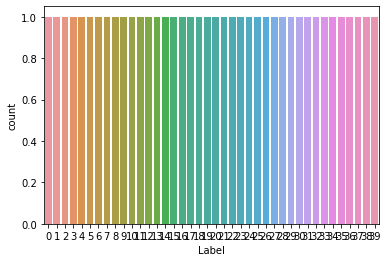

In [ ]:
sns.countplot(train_df['Label'])
plt.show()

## Data Preprocessing/Visualization


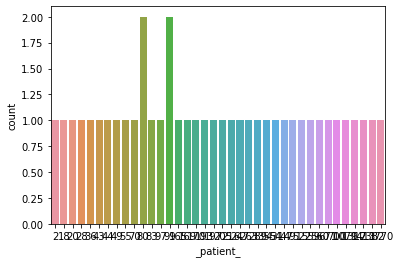

In [ ]:
sns.countplot(train_df['_patient_'])
plt.show()

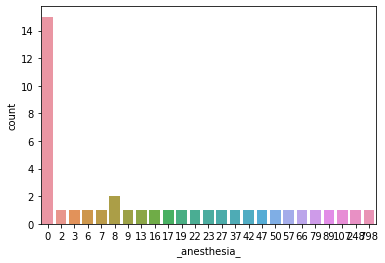

In [ ]:
sns.countplot(train_df['_anesthesia_'])
plt.show()

## Data Preperation


#### X & Y

In [ ]:
y = train_df["Label"]
y

0      0
1      1
2      2
3      3
4      4
5      5
6      6
7      7
8      8
9      9
10    10
11    11
12    12
13    13
14    14
15    15
16    16
17    17
18    18
19    19
20    20
21    21
22    22
23    23
24    24
25    25
26    26
27    27
28    28
29    29
30    30
31    31
32    32
33    33
34    34
35    35
36    36
37    37
38    38
39    39
Name: Label, dtype: int64

In [ ]:
X = train_df.drop("Label", axis = 1)
X

,_patient_,_right_,_left_,_history_,_placed_,_normal_,_well_,_pain_,_procedure_,_mg_,...,_signs_,_done_,_rate_,_exam_,_intact_,_nerve_,_muscle_,_medial_,_distal_,_bleeding_
0,559,77,111,270,33,197,102,197,13,71,...,61,40,67,22,43,2,13,0,7,51
1,3770,2558,2546,314,2365,628,1260,354,1727,173,...,102,348,40,114,165,357,274,381,486,374
2,216,475,480,71,74,434,78,82,55,66,...,23,29,43,171,71,40,43,35,81,6
3,170,107,106,42,48,22,40,39,29,7,...,21,1,3,8,28,0,8,70,55,3
4,522,495,518,292,97,353,140,179,64,212,...,66,56,44,137,102,60,95,19,63,16
5,700,148,135,216,233,243,182,138,271,132,...,50,48,36,57,15,1,12,2,56,110
6,1411,913,778,275,752,258,533,598,332,110,...,67,120,21,63,145,247,129,346,254,74
7,1317,1096,1317,520,340,520,304,176,417,362,...,71,108,199,57,41,17,49,14,203,45
8,289,206,99,94,112,63,40,42,52,29,...,11,24,16,31,8,3,7,9,22,22
9,355,181,191,101,169,102,106,25,101,15,...,30,31,11,24,29,9,13,15,3,41


### Splitting Testing and Training

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state=90      )
X_train


,_patient_,_right_,_left_,_history_,_placed_,_normal_,_well_,_pain_,_procedure_,_mg_,...,_signs_,_done_,_rate_,_exam_,_intact_,_nerve_,_muscle_,_medial_,_distal_,_bleeding_
21,560,140,87,136,31,90,109,133,22,276,...,39,47,38,19,17,2,9,5,10,7
22,18,107,83,2,1,33,12,1,0,0,...,0,1,1,1,31,0,7,3,6,0
2,216,475,480,71,74,434,78,82,55,66,...,23,29,43,171,71,40,43,35,81,6
1,3770,2558,2546,314,2365,628,1260,354,1727,173,...,102,348,40,114,165,357,274,381,486,374
15,447,20,21,265,9,46,51,48,0,141,...,13,13,19,15,10,1,2,0,2,1
30,197,35,45,139,16,105,98,20,38,27,...,33,25,40,30,13,5,13,0,3,11
6,1411,913,778,275,752,258,533,598,332,110,...,67,120,21,63,145,247,129,346,254,74
23,83,21,45,29,9,23,35,5,22,12,...,3,6,6,3,1,1,3,6,2,8
25,70,10,8,52,0,153,21,36,1,22,...,23,2,22,12,39,1,11,0,4,12
35,97,65,63,52,7,25,20,116,0,7,...,1,5,0,7,5,17,8,24,4,0


In [ ]:
X_test

,_patient_,_right_,_left_,_history_,_placed_,_normal_,_well_,_pain_,_procedure_,_mg_,...,_signs_,_done_,_rate_,_exam_,_intact_,_nerve_,_muscle_,_medial_,_distal_,_bleeding_
39,28,2,13,29,0,12,7,14,0,22,...,5,3,6,7,1,3,6,0,1,0
36,20,2,2,26,2,11,7,5,0,6,...,6,2,3,2,9,2,1,0,0,0
7,1317,1096,1317,520,340,520,304,176,417,362,...,71,108,199,57,41,17,49,14,203,45
26,2,18,5,4,0,0,2,1,0,0,...,0,0,0,0,0,0,0,0,0,0
14,80,74,40,46,2,42,16,161,1,12,...,4,10,1,9,7,12,9,2,0,0
17,43,11,3,25,1,6,15,16,0,28,...,1,2,6,9,7,1,0,2,1,2
20,671,261,214,140,280,116,129,92,190,21,...,16,75,10,18,15,17,22,14,41,75
5,700,148,135,216,233,243,182,138,271,132,...,50,48,36,57,15,1,12,2,56,110


## Model Building


### logistic regression


In [ ]:
from sklearn.tree import DecisionTreeClassifier
rf = DecisionTreeClassifier()
rf.fit(X_train, y_train)

DecisionTreeClassifier()

In [ ]:
y_rftrain_pred = rf.predict(X_train)
y_rftest_pred = rf.predict(X_test)
y_rftrain_pred


array([21, 22,  2,  1, 15, 30,  6, 23, 25, 35, 12, 37, 38,  8, 33, 24,  0,
        9, 28, 13, 34, 16, 19, 11, 32, 10, 18,  4,  3, 31, 29, 27])

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score

rf_train_mse = mean_squared_error(y_train, y_rftrain_pred)

rf_train_r2 = r2_score(y_train, y_rftrain_pred)

rf_test_mse = mean_squared_error(y_test, y_rftest_pred)

rf_test_r2 = r2_score(y_test, y_rftest_pred)

rf.result = pd.DataFrame([rf_train_mse,rf_train_r2, rf_test_mse, rf_test_r2]).transpose()
rf.result

,0,1,2,3
0,0.0,1.0,36.875,0.729358


## Predict Data ##

New_test transfer to database_test

In [ ]:
test_df

,transcription
0,"PAST MEDICAL CONDITION:, None.,ALLERGIES:, N..."
1,"CURRENT HISTORY:, A 94-year-old female from t..."
2,"TITLE OF PROCEDURE: ,Coronary artery bypass g..."
3,"PROCEDURE: , Bilateral L5, S1, S2, and S3 radi..."
4,"OPERATIVE PROCEDURES: , Colonoscopy and biopsi..."
...,...
992,"HISTORY OF PRESENT ILLNESS: , The patient is a..."
993,"S -, An 84-year-old diabetic female, 5'7-1/2"" ..."
994,"CHIEF COMPLAINT:, Neck pain, thoracalgia, low..."
995,"CHIEF COMPLAINT:, Non-healing surgical wound ..."


In [ ]:
test_dict = []
for i in range(997):
  # get the transcription from the current row 
  cur = (test_df.transcription[i]).lower() 

  # remove number
  cur = re.sub(r'\d+', '', cur)

  # remove puntuations
  cur = re.sub(r'[^\w\s]', '', cur)

  # split the string by spaces and store it as an array
  words = cur.split(" ")

  # Create a dictonary for this label
  test_dict.append(default_dict.copy())

  # Iterate over each word in words
  for word in words:
    # Increment the value if the word is in the dictionary
    if word in default_dict:
      test_dict[i][word] = test_dict[i][word] + 1

In [ ]:
# Help to print the list of dictionaries neatly
import tabulate
header = test_dict[0].keys()
rows = [x.values() for x in test_dict]
print(tabulate.tabulate(rows, header))

  patient    right    left    history    placed    normal    well    pain    procedure    mg    time    without    also    incision    blood    used    skin    performed    noted    using    room    x    removed    diagnosis    yearold    dr    taken    anterior    anesthesia    cm    back    closed    mm    area    two    fashion    one    lateral    made    posterior    general    position    upper    operating    tissue    vicryl    cc    present    patients    lower    evidence    disease    approximately    medical    artery    given    preoperative    day    good    chest    small    sterile    suture    negative    pressure    denies    clear    daily    side    bone    stable    examination    surgery    obtained    head    next    prepped    wound    identified    care    brought    within    neck    significant    draped    loss    heart    would    seen    condition    signs    done    rate    exam    intact    nerve    muscle    medial    distal    bleeding
---------  -----

In [ ]:
# FOR TEST
import sqlite3
import pandas as pd

# Connect to the SQLite database
sql_connect = sqlite3.connect('intact_test.db')
cursor = sql_connect.cursor()

# Create a string that represent commas seperated column names 
words_space = ""
for i in range(100):
  words_space += "_" + most_occur[i][0]
  if i < 99:
    words_space += "_, "

# Generate a string that reflect the structure of the Table
columns = "(" + words_space + ");"

# Create the Table
create = "CREATE TEMP TABLE Dictionary_TEST" + columns
cursor.execute(create)

# For each given transcription, create a row for it 
size = len(test_dict)
for i in range(size):
  # Cast the frequency dict for the ith label to a list 
  values_to_insert = "("
  lst = list(test_dict[i].keys())
  for j in range(100):
    # For each of the top 100 frequent words, attach the count for ith label as a value to insert
    values_to_insert += str(test_dict[i][lst[j]])
    if j < 99:
      values_to_insert += ", "
  values_to_insert += ");"
  
  # Insert the row into Dictionary
  insert = "INSERT INTO Dictionary_TEST (" + words_space + ") VALUES " + values_to_insert
  cursor.execute(insert)

# Select all entries from Dictionary
query = "SELECT * FROM Dictionary_TEST;"
results = cursor.execute(query).fetchall()
pd.read_sql_query(query,sql_connect)

# Export the DataFrame to a CSV file without including the index
db_df = pd.read_sql_query(query, sql_connect)
db_df.to_csv('database_test.csv', index=True)

Read actual test

In [ ]:
newtest_df = pd.read_csv("/content/database_test.csv", index_col=0)
newtest_df 


,_patient_,_right_,_left_,_history_,_placed_,_normal_,_well_,_pain_,_procedure_,_mg_,...,_signs_,_done_,_rate_,_exam_,_intact_,_nerve_,_muscle_,_medial_,_distal_,_bleeding
0,33,12,8,2,0,5,4,19,0,1,...,0,0,0,1,0,4,3,1,0,0
1,1,0,0,4,0,0,0,0,0,8,...,0,0,0,0,0,0,0,0,0,0
2,5,4,5,0,7,0,1,0,3,0,...,0,0,0,0,0,0,0,0,0,0
3,11,0,0,0,1,1,0,2,8,0,...,2,0,0,0,0,1,1,0,0,1
4,2,0,1,1,1,2,0,0,1,1,...,0,2,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
992,5,2,2,1,4,0,0,0,2,0,...,0,0,0,0,0,0,0,0,0,0
993,1,0,5,1,0,0,1,0,0,0,...,0,0,0,0,0,0,0,2,0,0
994,3,11,1,18,0,2,7,27,0,1,...,1,1,1,0,3,0,0,1,0,0
995,3,5,8,4,0,1,0,1,0,0,...,1,0,0,0,0,0,0,0,0,1


In [ ]:
submission_pred = rf.predict(newtest_df)
submission_pred

array([34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34,
       34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34,
       34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34,
       34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34,
       34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34,
       34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34,
       34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34,
       34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34,
       34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34,
       34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34,
       34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34,
       34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34,
       34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34, 34,
       34, 34, 34, 34, 34

In [ ]:
final_prediction = pd.DataFrame({
    'Predicted': submission_pred,
})
final_prediction.to_csv('submission.csv', index = True)